#     Imaterialist Fashion (2020)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/CS444/CS_444_Project_Files

/content/drive/MyDrive/CS444/CS_444_Project_Files


In [ ]:
ls

best_model_unet_entropy_adam_512.h5  sample_submission.csv
best_model_unet_entropy_adam.h5      test/
best_model_unet_entropy_sgd1.h5      tf_lite_model.tflite
best_model_unet_entropy_sgd2.h5      train/
best_model_unet_entropy_sgd3.h5      train.csv
best_model_unet_entropy_sgd_512.h5   unet_entropy_adam_results_512.csv
best_model_unet_entropy_sgd.h5       unet_entropy_adam_results.csv
best_model_unet_focal_adam.h5        unet_entropy_sgd_results1.csv
best_model_unet_focal_sgd.h5         unet_entropy_sgd_results2.csv
CS444_Shubham_Unet_256.ipynb         unet_entropy_sgd_results3.csv
imaterialist-fashion-2020-fgvc7.zip  unet_entropy_sgd_results_512.csv
label_descriptions.json              unet_entropy_sgd_results.csv
logs/                                unet_focal_adam_results.csv
masks/                               unet_focal_sgd_results.csv
masks.png                            Unet.py
__pycache__/                         utilities.py


In [ ]:
# importing libraries
import cv2
import os
import json
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from PIL import Image
%matplotlib inline

import tensorflow as tf


In [ ]:
tf.config.run_functions_eagerly(True)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

## Reading files

In [ ]:
#parse label data
with open(r'/content/drive/MyDrive/CS444/CS_444_Project_Files/label_descriptions.json') as labels_json:
    labels_df = json.load(labels_json)

print(labels_df['attributes'])

[{'id': 0, 'name': 'classic (t-shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 1, 'name': 'polo (shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 2, 'name': 'undershirt', 'supercategory': 'nickname', 'level': 1}, {'id': 3, 'name': 'henley (shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 4, 'name': 'ringer (t-shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 5, 'name': 'raglan (t-shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 6, 'name': 'rugby (shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 7, 'name': 'sailor (shirt)', 'supercategory': 'nickname', 'level': 1}, {'id': 8, 'name': 'crop (top)', 'supercategory': 'nickname', 'level': 1}, {'id': 9, 'name': 'halter (top)', 'supercategory': 'nickname', 'level': 1}, {'id': 10, 'name': 'camisole', 'supercategory': 'nickname', 'level': 1}, {'id': 11, 'name': 'tank (top)', 'supercategory': 'nickname', 'level': 1}, {'id': 12, 'name': 'peasant (top)', 'supercategory': 'nickname', 'level': 1},

In [ ]:
categories=pd.DataFrame(labels_df['categories'])
categories

,id,name,supercategory,level
0,0,"shirt, blouse",upperbody,2
1,1,"top, t-shirt, sweatshirt",upperbody,2
2,2,sweater,upperbody,2
3,3,cardigan,upperbody,2
4,4,jacket,upperbody,2
5,5,vest,upperbody,2
6,6,pants,lowerbody,2
7,7,shorts,lowerbody,2
8,8,skirt,lowerbody,2
9,9,coat,wholebody,2


In [ ]:
categories['supercategory'].value_counts()

decorations       10
garment parts      7
upperbody          6
wholebody          4
legs and feet      4
lowerbody          3
head               3
others             3
arms and hands     2
closures           2
neck               1
waist              1
Name: supercategory, dtype: int64

In [ ]:
attributes=pd.DataFrame(labels_df['attributes'])
attributes

,id,name,supercategory,level
0,0,classic (t-shirt),nickname,1
1,1,polo (shirt),nickname,1
2,2,undershirt,nickname,1
3,3,henley (shirt),nickname,1
4,4,ringer (t-shirt),nickname,1
...,...,...,...,...
289,336,peacock,animal,2
290,337,zebra,animal,2
291,338,giraffe,animal,2
292,339,toile de jouy,textile pattern,1


In [ ]:
attributes['supercategory'].value_counts()

nickname                                       153
silhouette                                      25
neckline type                                   25
textile finishing, manufacturing techniques     21
textile pattern                                 18
length                                          15
opening type                                    10
non-textile material type                       10
waistline                                        7
animal                                           6
leather                                          4
Name: supercategory, dtype: int64

In [ ]:
#load training data
train_df = pd.read_csv('train.csv')

In [ ]:
train_df

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds
0,00000663ed1ff0c4e0132b9b9ac53f6e,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317"
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317"
2,00000663ed1ff0c4e0132b9b9ac53f6e,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163
3,00000663ed1ff0c4e0132b9b9ac53f6e,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204"
4,00000663ed1ff0c4e0132b9b9ac53f6e,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219
...,...,...,...,...,...,...
333396,fffe20b555b98c3c1f26c8dfff275cbc,2712731 8 2715725 23 2718719 39 2721713 55 272...,3000,2001,28,163
333397,ffffbf7014a9e408bfbb81a75bc70638,71179 1 71678 3 72178 4 72678 4 73178 5 73679 ...,500,375,33,NaN
333398,ffffbf7014a9e408bfbb81a75bc70638,116648 5 117148 16 117648 22 118148 26 118647 ...,500,375,31,157
333399,ffffbf7014a9e408bfbb81a75bc70638,67711 1 68210 1 68709 2 69204 2 69208 3 69705 ...,500,375,31,157


## Basic Stats

In [ ]:
print("number of rows in train_df",train_df.shape[0])
print("number of features in train_df",train_df.shape[1])

number of rows in train_df 333401
number of features in train_df 6


In [ ]:
train_df['ImageId'].nunique()

45623

In [ ]:
train_df.columns

Index(['ImageId', 'EncodedPixels', 'Height', 'Width', 'ClassId',
       'AttributesIds'],
      dtype='object')

In [ ]:
train_df["ClassId"] = train_df["ClassId"].astype('str')

In [ ]:
train_df['category']=train_df['ClassId'].str.split('_').str[0]

In [ ]:
train_df.head()

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,category
0,00000663ed1ff0c4e0132b9b9ac53f6e,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317",6
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317",0
2,00000663ed1ff0c4e0132b9b9ac53f6e,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163,28
3,00000663ed1ff0c4e0132b9b9ac53f6e,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204",31
4,00000663ed1ff0c4e0132b9b9ac53f6e,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219,32


In [ ]:
train_df['ImageId'] = train_df['ImageId'] + '.jpg'

In [ ]:
#train_df['attributes']=train_df['ClassId'].str.split('_').str[1:]

In [ ]:
train_df

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,category
0,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317",6
1,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317",0
2,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163,28
3,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204",31
4,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219,32
...,...,...,...,...,...,...,...
333396,fffe20b555b98c3c1f26c8dfff275cbc.jpg,2712731 8 2715725 23 2718719 39 2721713 55 272...,3000,2001,28,163,28
333397,ffffbf7014a9e408bfbb81a75bc70638.jpg,71179 1 71678 3 72178 4 72678 4 73178 5 73679 ...,500,375,33,NaN,33
333398,ffffbf7014a9e408bfbb81a75bc70638.jpg,116648 5 117148 16 117648 22 118148 26 118647 ...,500,375,31,157,31
333399,ffffbf7014a9e408bfbb81a75bc70638.jpg,67711 1 68210 1 68709 2 69204 2 69208 3 69705 ...,500,375,31,157,31


In [ ]:
print("number of rows in train_df: ",train_df.shape[0])
print("number of columns in train_df: ",train_df.shape[1])

number of rows in train_df:  333401
number of columns in train_df:  7


## rle 2mask function

In [ ]:
#https://www.kaggle.com/kimwoojeong/simple-eda-imaterialist-fashion-2019-at-fgvc6
'''
THE FUNCTION CONVERTS RUN LENGTH ENCODING GIVEN TO CORRESPONDING IMAGE ID 
IN TRAIN.CSV FILE TO MASK . THIS IS THE TRUE MASK IMAGE.
IT TAKES IMAGE_FILENAME  , RLE , CATEGORY LIST,HEIGHT AND WIDTH OF IMAGE 
AS INPUT AND OUTPUTS THE MASK OF FIXED SIZE (512,512)
'''

def rle2mask(image_filename,mask_rle,cat,H,W):

   
   
   mask=np.ones((H*W),dtype='uint8')*255

   en_list=mask_rle

   cat = np.int32(cat)
   sorted_index = np.argsort(cat)
   
   for i in sorted_index:


     px_list=list(map(int,en_list[i].split(" ")[0::2]))
     
    
     px_count_list=list(map(int,en_list[i].split(" ")[1::2]))
     
    
     cat_list=int(cat[i])
     
     tu=list(map(lambda x, y:(x,y), px_list, px_count_list))
     for p,m in tu:
       
        mask[p:p+m]=cat_list
       
   
   mask = mask.reshape((W,H)).T
   mask=cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR)
   mask=cv2.resize(mask, (512, 512),interpolation=cv2.INTER_NEAREST)
  
   return mask


In [ ]:
image_df = train_df.groupby('ImageId')['EncodedPixels', 'category'].agg(lambda x: list(x))
size_df = train_df.groupby('ImageId')['Height', 'Width'].mean()
image_df = image_df.join(size_df, on='ImageId')

print("Total images: ", len(image_df))
image_df.head()

Total images:  45623


,EncodedPixels,category,Height,Width
ImageId,,,,
00000663ed1ff0c4e0132b9b9ac53f6e.jpg,[6068157 7 6073371 20 6078584 34 6083797 48 60...,"[6, 0, 28, 31, 32, 32, 31, 29, 4]",5214.0,3676.0
0000fe7c9191fba733c8a69cfaf962b7.jpg,[2201176 1 2203623 3 2206071 5 2208518 8 22109...,"[33, 1]",2448.0,2448.0
0002ec21ddb8477e98b2cbb87ea2e269.jpg,[2673735 2 2676734 8 2679734 13 2682733 19 268...,"[33, 10, 23, 23]",3000.0,1997.0
0002f5a0ebc162ecfb73e2c91e3b8f62.jpg,[435 132 1002 132 1569 132 2136 132 2703 132 3...,"[10, 33, 15]",567.0,400.0
0004467156e47b0eb6de4aa6479cbd15.jpg,[132663 8 133396 25 134130 41 134868 53 135611...,"[10, 33, 31, 31, 15]",750.0,500.0


In [ ]:
image_df2=image_df.reset_index()

In [ ]:
image_df2.head()

,ImageId,EncodedPixels,category,Height,Width
0,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,[6068157 7 6073371 20 6078584 34 6083797 48 60...,"[6, 0, 28, 31, 32, 32, 31, 29, 4]",5214.0,3676.0
1,0000fe7c9191fba733c8a69cfaf962b7.jpg,[2201176 1 2203623 3 2206071 5 2208518 8 22109...,"[33, 1]",2448.0,2448.0
2,0002ec21ddb8477e98b2cbb87ea2e269.jpg,[2673735 2 2676734 8 2679734 13 2682733 19 268...,"[33, 10, 23, 23]",3000.0,1997.0
3,0002f5a0ebc162ecfb73e2c91e3b8f62.jpg,[435 132 1002 132 1569 132 2136 132 2703 132 3...,"[10, 33, 15]",567.0,400.0
4,0004467156e47b0eb6de4aa6479cbd15.jpg,[132663 8 133396 25 134130 41 134868 53 135611...,"[10, 33, 31, 31, 15]",750.0,500.0


In [ ]:
image_df2['Height'] = image_df2['Height'].astype('int')
image_df2['Width'] = image_df2['Width'].astype('int')

In [ ]:
image_df2.head()

,ImageId,EncodedPixels,category,Height,Width
0,00000663ed1ff0c4e0132b9b9ac53f6e.jpg,[6068157 7 6073371 20 6078584 34 6083797 48 60...,"[6, 0, 28, 31, 32, 32, 31, 29, 4]",5214,3676
1,0000fe7c9191fba733c8a69cfaf962b7.jpg,[2201176 1 2203623 3 2206071 5 2208518 8 22109...,"[33, 1]",2448,2448
2,0002ec21ddb8477e98b2cbb87ea2e269.jpg,[2673735 2 2676734 8 2679734 13 2682733 19 268...,"[33, 10, 23, 23]",3000,1997
3,0002f5a0ebc162ecfb73e2c91e3b8f62.jpg,[435 132 1002 132 1569 132 2136 132 2703 132 3...,"[10, 33, 15]",567,400
4,0004467156e47b0eb6de4aa6479cbd15.jpg,[132663 8 133396 25 134130 41 134868 53 135611...,"[10, 33, 31, 31, 15]",750,500


In [ ]:
tr=train_df.groupby('category')['ImageId'].agg(lambda x: list(x)).to_frame('imageid').reset_index()

In [ ]:
tr['category']=tr['category'].astype('int')

In [ ]:
tr1=tr.sort_values('category', ascending=True)

In [ ]:
tr1 = tr1.reset_index(drop=True)

In [ ]:
tr1

,category,imageid
0,0,"[00000663ed1ff0c4e0132b9b9ac53f6e.jpg, 0010ef2..."
1,1,"[0000fe7c9191fba733c8a69cfaf962b7.jpg, 00048c3..."
2,2,"[003a6ca3eaa7886da61ed2de2c5e8d27.jpg, 003ad8a..."
3,3,"[000aac3870ea7c59ca0333ffa5327323.jpg, 00573a5..."
4,4,"[00000663ed1ff0c4e0132b9b9ac53f6e.jpg, 000c5bb..."
5,5,"[009447b79fce7da1ee19a54401517cde.jpg, 011b635..."
6,6,"[00000663ed1ff0c4e0132b9b9ac53f6e.jpg, 000775b..."
7,7,"[000cd2e13d1bdd28f480304d7bb9e1ca.jpg, 00211c0..."
8,8,"[00048c3a2fb9c29340473c4cfc06424a.jpg, 0006ea8..."
9,9,"[003a6ca3eaa7886da61ed2de2c5e8d27.jpg, 0050bcb..."


In [ ]:
tr1.columns

Index(['category', 'imageid'], dtype='object')

In [ ]:
my_dict = {k:v for k,v in zip(tr1['category'], tr1.drop(columns='category').values)}

## Train Test Split

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(image_df2, test_size = 0.2,random_state=42)
X_train, X_val = train_test_split(X_train, test_size = 0.2,random_state=42)
print('train shape : ',X_train.shape)
print('test shape : ', X_test.shape)
print('val shape : ', X_val.shape)
     


train shape :  (29198, 5)
test shape :  (9125, 5)
val shape :  (7300, 5)


In [ ]:
X_train.head()

,ImageId,EncodedPixels,category,Height,Width
18575,686ecf7379da7821456c62c5ce9ffe7c.jpg,[446567 2 447843 6 449121 9 450401 9 450417 17...,"[23, 23, 10, 33, 4, 31, 31, 29, 35, 35]",1280,852
45573,ffb1f382a83916396f2d2d5d549cacb8.jpg,[21124834 13 21132765 37 21140702 56 21148647 ...,"[1, 7, 23, 23, 32, 32, 33]",7952,5304
32774,b7c1b3fa410baa58896c037ac6422d97.jpg,[154592 11 155342 11 155400 29 156157 24 15620...,"[2, 6, 22, 23, 23, 31, 31, 33]",825,550
17694,6386f18bec087cb9b39ae59e9a57b22b.jpg,[101965 12 103044 37 104123 52 105202 56 10628...,"[24, 6, 32, 32, 36, 36, 36, 36, 36, 36, 36, 36...",1080,1080
3067,1144e70dcf1eaf63ee3f845026eac8de.jpg,[670047 49 672995 106 675985 121 678977 134 68...,"[4, 31, 16, 32, 31, 29, 28, 0, 6, 31, 23, 23]",3000,2000


## TF Data Pipeline

In [ ]:

def parse_image(i,m):
    '''
    THIS FUNCTION READS IMAGE AND MASK STORED ON LOCAL DISK
    RESIZED THE IMAGE TO 256 * 256 WHICH WILL BE INPUT TO MODEL
    DECODES JPEG IMAGE AND PNG MASK
    '''
    
    image = tf.io.read_file('train/'+i)
    image = tf.image.decode_jpeg(image,channels=3)
   
    image = tf.image.resize(image, [256, 256])
    image = image / 255
    
    
    mask = tf.io.read_file(r'masks/'+m)
    
    
    mask = tf.image.decode_png(mask,channels=3)
    #print(tf.math.reduce_max(mask))
    #plt.imshow(mask)
    #print(mask.shape)
    mask=tf.image.rgb_to_grayscale(mask)
    #print(mask)
    #plt.imshow(mask)
    mask=tf.image.resize(mask,[256,256],method='nearest')
    #print(mask.shape)
    #print(mask.dtype)
    
    mask=tf.where(condition=tf.math.equal(mask, 255), x=tf.cast(46, dtype=mask.dtype), y=mask)
    mask=tf.cast(mask,'float32')
    #print("End :" ,mask)
    #print("Max:",tf.math.reduce_max(mask))
    #print("Min:",tf.math.reduce_min(mask))
    return image,mask
     

In [ ]:
def random_augmentation(img, mask):
    '''
    THIS FUNCTION FLIPS IMAGE AND MASK FROM LEFT TO RIGHT
    RANDOM AUGMENTATION
    '''
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)
    

    return img, mask

In [ ]:
# CREATING MASK USING FUNCTION RLETOMASK

########## DO NO RUN ##################
'''from PIL import Image


out_path=r'masks/'
temp_df = pd.concat([image_df2["ImageId"],image_df2["EncodedPixels"],image_df2["category"],image_df2["Height"],image_df2["Width"]], axis=1)
temp_df.head()
for index, row in temp_df.iterrows():
    mask = rle2mask(row["ImageId"], row["EncodedPixels"], row["category"], row["Height"], row["Width"])
    im = Image.fromarray(mask)
    im.save(out_path+row["ImageId"].replace('.jpg', '.png'))
    '''


'from PIL import Image\n\n\nout_path=r\'masks/\'\ntemp_df = pd.concat([image_df2["ImageId"],image_df2["EncodedPixels"],image_df2["category"],image_df2["Height"],image_df2["Width"]], axis=1)\ntemp_df.head()\nfor index, row in temp_df.iterrows():\n    mask = rle2mask(row["ImageId"], row["EncodedPixels"], row["category"], row["Height"], row["Width"])\n    im = Image.fromarray(mask)\n    im.save(out_path+row["ImageId"].replace(\'.jpg\', \'.png\'))\n    '

In [ ]:
#https://www.tensorflow.org/guide/data
def tfdata_train(Tr,batch_size=5):
      '''
      THIS FUNCTION CREATES TF DATASET FROM TENSOR SLICES OF 
      IMAGE AND MASK TRAIN DATA THEN IT SHUFFLES IT MAPS THE PARSE_IMAGE FUNCTION,RANDOM_AUGMENTATION
      AND BATCHES IT TO BATCH_SIZE AND PREFETCHES THE DATA DURING TRAINING PROCESS
      '''
      

      f = Tr["ImageId"]
      g = Tr["ImageId"].str.replace('.jpg','.png',regex=False)
      
      train_dataset=tf.data.Dataset.from_tensor_slices((f,g))
      train_dataset= train_dataset.shuffle(len(f))
      train_dataset= train_dataset.map(parse_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
      train_dataset = train_dataset.map(random_augmentation, num_parallel_calls=tf.data.experimental.AUTOTUNE)
      train_dataset = train_dataset.batch(batch_size)
      train_dataset = train_dataset.prefetch(buffer_size=3)  
      return train_dataset
    

In [ ]:
# https://www.tensorflow.org/guide/data
def tfdata_val(Val,batch_size=5):
    
    '''
    THIS FUNCTION CREATES TF DATASET FROM TENSOR SLICES OF 
    IMAGE AND MASK VALIDATION DATA THEN IT SHUFFLES IT MAPS THE PARSE_IMAGE FUNCTION
    AND BATCHES IT TO BATCH_SIZE  DURING TRAINING PROCESS
    '''
    f = Val["ImageId"]
    g = Val["ImageId"].str.replace('.jpg','.png',regex=False)
    val_dataset = tf.data.Dataset.from_tensor_slices((f,g))
    val_dataset = val_dataset.shuffle(len(f))
    val_dataset = val_dataset.map(parse_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    val_dataset = val_dataset.batch(batch_size)
    
    return val_dataset

In [ ]:
#https://www.tensorflow.org/guide/data
def tfdata_test(Test,batch_size=5):
  '''
  THIS FUNCTION CREATES TF DATASET FROM TENSOR SLICES OF 
  IMAGE AND MASK TEST DATA THEN IT SHUFFLES IT MAPS THE PARSE_IMAGE FUNCTION
  AND BATCHES IT TO BATCH_SIZE  DURING TRAINING PROCESS.
  '''
  f = Test["ImageId"]
  g = Test["ImageId"].str.replace('.jpg','.png',regex=False)
  test_dataset = tf.data.Dataset.from_tensor_slices((f, g))
  test_dataset = test_dataset.map(parse_image)
  test_dataset = test_dataset.batch(batch_size)
  
  return test_dataset

In [ ]:
train_dataset=tfdata_train(X_train)

In [ ]:
val_dataset=tfdata_val(X_val)

In [ ]:

test_dataset =tfdata_test(X_test)

In [ ]:
#https://www.tensorflow.org/tutorials/images/segmentation
def display(display_list):
  '''
  THIS FUNCTION DISPLAYS INPUT IMAGE AND TRUE MASK 
  FROM TF DATASET CREATED ABOVE
  '''
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

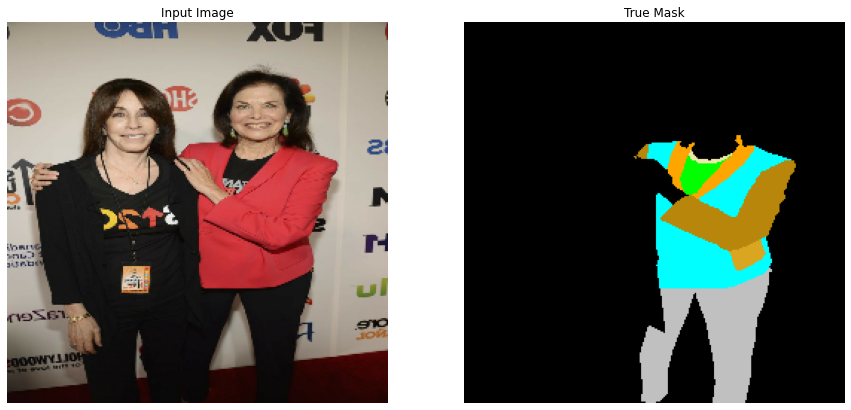

In [ ]:
#PLOTTING IMAGE AND TRUE COLOR CODED MASK
colormap=[[255,0,0],[0,255,0],[0,0,255],[255,255,0],[0,255,255],[255,0,255],[192,192,192],[128,128,128],[128,0,0],[128,128,0],[0,128,0],[128,0,128],[0,128,128],[0,0,128],[128,0,0],[139,0,0],[165,42,42],[178,34,34],[220,20,60],[255,0,0],[255,99,71],[255,127,80],[205,92,92],[240,128,128],[233,150,122],[250,128,114],[255,160,122],[255,69,0],[255,140,0],[255,165,0],[255,215,0],[184,134,11],[218,165,32],[238,232,170],[189,183,107],[240,230,140],[128,128,0],[154,205,50],[85,107,47],[107,142,35],[124,252,0],[127,255,0],[173,255,47],[0,100,0],[0,128,0],[34,139,34],[0,0,0]]
for image, mask in train_dataset.take(1):
  sample_image, sample_mask = image, mask

for i in range (0,47):
   sample_mask= np.where(sample_mask[:,:]==i,colormap[i],sample_mask)
display([sample_image[0], sample_mask[0]])

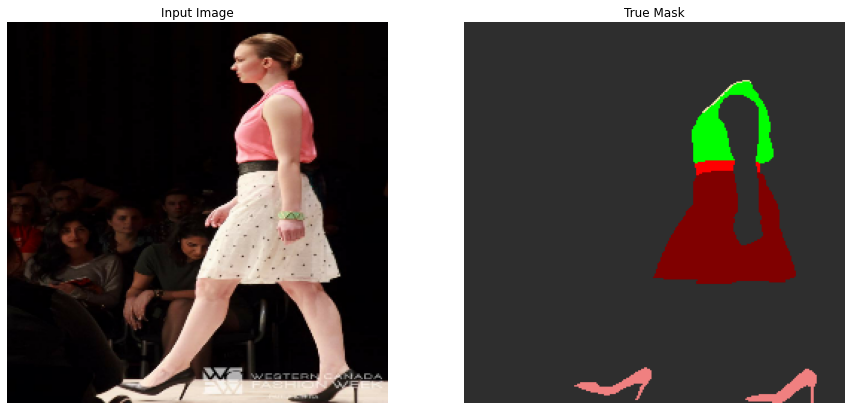

In [ ]:
colormap=[[255,0,0],[0,255,0],[0,0,255],[255,255,0],[0,255,255],[255,0,255],[192,192,192],[128,128,128],[128,0,0],[128,128,0],[0,128,0],[128,0,128],[0,128,128],[0,0,128],[128,0,0],[139,0,0],[165,42,42],[178,34,34],[220,20,60],[255,0,0],[255,99,71],[255,127,80],[205,92,92],[240,128,128],[233,150,122],[250,128,114],[255,160,122],[255,69,0],[255,140,0],[255,165,0],[255,215,0],[184,134,11],[218,165,32],[238,232,170],[189,183,107],[240,230,140],[128,128,0],[154,205,50],[85,107,47],[107,142,35],[124,252,0],[127,255,0],[173,255,47],[0,100,0],[0,128,0],[34,139,34]]
for image, mask in val_dataset.take(1):
  sample_image, sample_mask = image, mask
for i in range (0,46):
   sample_mask= np.where(sample_mask[:,:]==i,colormap[i],sample_mask)
display([sample_image[0], sample_mask[0]])

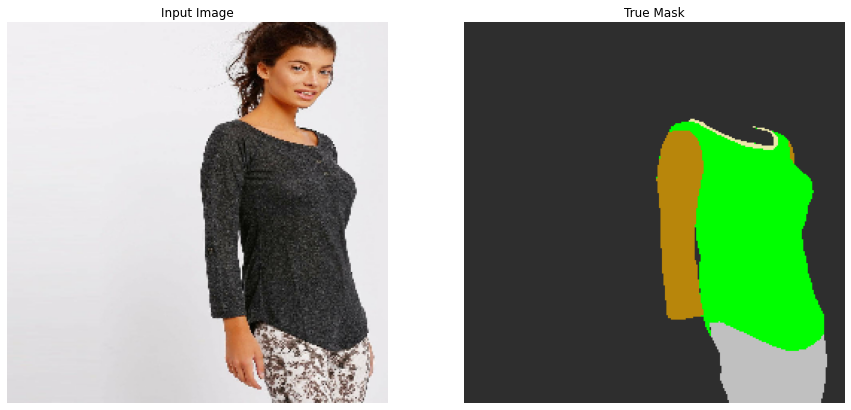

In [ ]:
colormap=[[255,0,0],[0,255,0],[0,0,255],[255,255,0],[0,255,255],[255,0,255],[192,192,192],[128,128,128],[128,0,0],[128,128,0],[0,128,0],[128,0,128],[0,128,128],[0,0,128],[128,0,0],[139,0,0],[165,42,42],[178,34,34],[220,20,60],[255,0,0],[255,99,71],[255,127,80],[205,92,92],[240,128,128],[233,150,122],[250,128,114],[255,160,122],[255,69,0],[255,140,0],[255,165,0],[255,215,0],[184,134,11],[218,165,32],[238,232,170],[189,183,107],[240,230,140],[128,128,0],[154,205,50],[85,107,47],[107,142,35],[124,252,0],[127,255,0],[173,255,47],[0,100,0],[0,128,0],[34,139,34]]

for image, mask in test_dataset.take(1):
  sample_image, sample_mask = image, mask
for i in range (0,46):
   sample_mask= np.where(sample_mask[:,:]==i,colormap[i],sample_mask)
display([sample_image[0], sample_mask[0]])

In [ ]:
n = tf.keras.metrics.MeanIoU(num_classes=47)
def get_mean_iou(y_true, y_pred):
    '''
    THIS FUNCTION IS IOU METRIC FUNCTION.IT TAKES Y_TRUE AND Y_PRED WHICH IS TRUE MASK AND PREDICTED MASK COMPUTES 
    INTERSECTION OVER UNION WITH THESE MASK IMAGES.The metric sweeps over a range of IoU thresholds, at each point calculating an average precision value. 
    The threshold values range from 0.5 to 0.95 with a step size of 0.05: (0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95). 
    In other words, at a threshold of 0.5, a predicted object is considered a "hit" if its intersection over union with a ground truth object is greater than 0.5.
    '''
    y_true=tf.one_hot(tf.cast(y_true, dtype='int32'),47)
    for t in np.arange(0.5, 0.95, 0.05):
        y_pred = tf.where(condition=tf.math.greater(y_pred, tf.cast(t, y_pred.dtype)), x=tf.cast(1, y_pred.dtype), y=y_pred)
        y_pred = tf.where(condition=tf.math.less_equal(y_pred, tf.cast(t, y_pred.dtype)), x=tf.cast(0,y_pred.dtype), y=y_pred)
        
        n.update_state(y_true, y_pred)
    r = n.result().numpy()
    
    n.reset_states()
    return r

## Deep Learning Model UNet

THE MODEL ARCHITECTURE TAKEN FROM https://coderoad.ru/59343661/Unet-%D0%9C%D1%83%D0%BB%D1%8C%D1%82%D0%B8%D0%BA%D0%BB%D0%B0%D1%81%D1%81%D0%BE%D0%B2%D0%B0%D1%8F-%D0%A1%D0%B5%D0%B3%D0%BC%D0%B5%D0%BD%D1%82%D0%B0%D1%86%D0%B8%D1%8F-%D0%98%D0%B7%D0%BE%D0%B1%D1%80%D0%B0%D0%B6%D0%B5%D0%BD%D0%B8%D0%B9

In [ ]:
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, UpSampling2D, concatenate,Dropout,Reshape
from tensorflow.keras.models import Model
def soft1(x):
    return tf.keras.activations.softmax(x)

def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):

    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)


    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def get_unet(input_img, n_classes, n_filters = 16, dropout = 0.1, batchnorm = True):
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)

    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)

    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)

    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)

    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)

    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)

    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)

    outputs = Conv2D(47, (1, 1), activation='softmax') (c9)
    model1 = Model(inputs=[input_img], outputs=[outputs])
    return model1

    

### Cross Entropy Loss - Adam

In [ ]:
tf.keras.backend.clear_session()
input_img = Input((256, 256, 3), name='img')
model_unet_entropy_adam = get_unet(input_img,n_classes=47, n_filters=16, dropout=0.05, batchnorm=True)
model_unet_entropy_adam.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 16  448         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 256, 256, 16  64         ['conv2d_1[0][0]']               
 rmalization)                   )                                                             

In [ ]:
## training ( cross entropy loss and adam)

import datetime
import os

EPOCHS = 30
BATCH_SIZE=128

STEPS_PER_EPOCH = X_train.shape[0] // BATCH_SIZE
VALIDATION_STEPS = X_val.shape[0] // BATCH_SIZE
    
tensorboard_callback = tf.keras.callbacks.TensorBoard('./logs', histogram_freq=1)

callbacks = [
    
    # to collect some useful metrics and visualize them in tensorboard
    tensorboard_callback,
    # if no accuracy improvements we can stop the training directly
    tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    # to save checkpoints
    tf.keras.callbacks.ModelCheckpoint('best_model_unet_entropy_adam.h5', verbose=1, save_weights_only=True)
     ]


optimizer=tf.keras.optimizers.Adam(lr=1e-3)

loss = tf.keras.losses.SparseCategoricalCrossentropy()

model_unet_entropy_adam.compile(optimizer=optimizer, loss = loss,
                  metrics=['accuracy',get_mean_iou])

model_unet_entropy_adam_history = model_unet_entropy_adam.fit(train_dataset, epochs=EPOCHS,
                    steps_per_epoch=STEPS_PER_EPOCH,batch_size=BATCH_SIZE,
                    validation_steps=VALIDATION_STEPS,
                    validation_data=val_dataset,
                    callbacks=callbacks)


Epoch 1/30
228/228 [==============================] - ETA: 0s - loss: 2.5853 - accuracy: 0.5908 - get_mean_iou: 0.5170
Epoch 1: saving model to best_model_unet_entropy_adam.h5
228/228 [==============================] - 386s 2s/step - loss: 2.5853 - accuracy: 0.5908 - get_mean_iou: 0.5170 - val_loss: 1.6025 - val_accuracy: 0.7817 - val_get_mean_iou: 0.5016
Epoch 2/30
228/228 [==============================] - ETA: 0s - loss: 1.1172 - accuracy: 0.7760 - get_mean_iou: 0.7868
Epoch 2: saving model to best_model_unet_entropy_adam.h5
228/228 [==============================] - 375s 2s/step - loss: 1.1172 - accuracy: 0.7760 - get_mean_iou: 0.7868 - val_loss: 1.1060 - val_accuracy: 0.7598 - val_get_mean_iou: 0.7888
Epoch 3/30
228/228 [==============================] - ETA: 0s - loss: 0.9442 - accuracy: 0.7838 - get_mean_iou: 0.8201
Epoch 3: saving model to best_model_unet_entropy_adam.h5
228/228 [==============================] - 381s 2s/step - loss: 0.9442 - accuracy: 0.7838 - get_mean_iou: 0.

In [ ]:
#Saving Results in csv

unet_entropy_adam_results = pd.DataFrame(model_unet_entropy_adam_history.history)
unet_entropy_adam_results.to_csv('unet_entropy_adam_results.csv')

In [ ]:
#Test results

pd.DataFrame(np.array(model_unet_entropy_adam.evaluate(test_dataset,steps=9039//128)).reshape(1,-1),columns=['test_loss','test_accuracy','test_iou'])

70/70 [==============================] - 30s 431ms/step - loss: 0.6586 - accuracy: 0.8263 - get_mean_iou: 0.8580


,test_loss,test_accuracy,test_iou
0,0.658599,0.826329,0.858032


### Cross Entropy Loss - SGD

In [ ]:
tf.keras.backend.clear_session()
input_img = Input((256, 256, 3), name='img')
model_unet_entropy_sgd = get_unet(input_img,n_classes=47, n_filters=16, dropout=0.05, batchnorm=True)
model_unet_entropy_sgd.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 16  448         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 256, 256, 16  64         ['conv2d_1[0][0]']               
 rmalization)                   )                                                             

In [ ]:
## training (cross entropy loss and sgd)

import datetime
import os

EPOCHS = 30
BATCH_SIZE=128

STEPS_PER_EPOCH = X_train.shape[0] // BATCH_SIZE
VALIDATION_STEPS = X_val.shape[0] // BATCH_SIZE
    
tensorboard_callback = tf.keras.callbacks.TensorBoard('./logs', histogram_freq=1)

callbacks = [
    
    # to collect some useful metrics and visualize them in tensorboard
    tensorboard_callback,
    # if no accuracy improvements we can stop the training directly
    tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    # to save checkpoints
    tf.keras.callbacks.ModelCheckpoint('best_model_unet_entropy_sgd.h5', verbose=1, save_weights_only=True)
     ]


optimizer=tf.keras.optimizers.SGD(lr=1e-2)

loss = tf.keras.losses.SparseCategoricalCrossentropy()

model_unet_entropy_sgd.compile(optimizer=optimizer, loss = loss,
                  metrics=['accuracy',get_mean_iou])

model_unet_entropy_sgd_history = model_unet_entropy_sgd.fit(train_dataset, epochs=EPOCHS,
                    steps_per_epoch=STEPS_PER_EPOCH,batch_size=BATCH_SIZE,
                    validation_steps=VALIDATION_STEPS,
                    validation_data=val_dataset,
                    callbacks=callbacks)


Epoch 1/30
228/228 [==============================] - ETA: 0s - loss: 2.1930 - accuracy: 0.6625 - get_mean_iou: 0.6038
Epoch 1: saving model to best_model_unet_entropy_sgd.h5
228/228 [==============================] - 148s 650ms/step - loss: 2.1930 - accuracy: 0.6625 - get_mean_iou: 0.6038 - val_loss: 1.4136 - val_accuracy: 0.7808 - val_get_mean_iou: 0.7305
Epoch 2/30
228/228 [==============================] - ETA: 0s - loss: 1.2767 - accuracy: 0.7865 - get_mean_iou: 0.8060
Epoch 2: saving model to best_model_unet_entropy_sgd.h5
228/228 [==============================] - 137s 601ms/step - loss: 1.2767 - accuracy: 0.7865 - get_mean_iou: 0.8060 - val_loss: 1.1815 - val_accuracy: 0.7922 - val_get_mean_iou: 0.8200
Epoch 3/30
228/228 [==============================] - ETA: 0s - loss: 1.2044 - accuracy: 0.7860 - get_mean_iou: 0.8130
Epoch 3: saving model to best_model_unet_entropy_sgd.h5
228/228 [==============================] - 135s 592ms/step - loss: 1.2044 - accuracy: 0.7860 - get_mean_i

In [ ]:
#Saving Results in csv

unet_entropy_sgd_results = pd.DataFrame(model_unet_entropy_sgd_history.history)
unet_entropy_sgd_results.to_csv('unet_entropy_sgd_results.csv')

In [ ]:
#Test results

pd.DataFrame(np.array(model_unet_entropy_sgd.evaluate(test_dataset,steps=9039//128)).reshape(1,-1),columns=['test_loss','test_accuracy','test_iou'])

70/70 [==============================] - 31s 442ms/step - loss: 0.9227 - accuracy: 0.7888 - get_mean_iou: 0.8302


,test_loss,test_accuracy,test_iou
0,0.922709,0.788793,0.830158


###### Focal loss

In [ ]:
#!pip install focal_loss
from focal_loss import BinaryFocalLoss,SparseCategoricalFocalLoss

### Focal Loss - Adam

In [ ]:
tf.keras.backend.clear_session()
input_img = Input((256, 256, 3), name='img')
model_unet_focal_adam = get_unet(input_img,n_classes=47, n_filters=16, dropout=0.05, batchnorm=True)
model_unet_focal_adam.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 16  448         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 256, 256, 16  64         ['conv2d_1[0][0]']               
 rmalization)                   )                                                             

In [ ]:
## training (focal loss and adam)

import datetime
import os

EPOCHS = 30
BATCH_SIZE=128

STEPS_PER_EPOCH = X_train.shape[0] // BATCH_SIZE
VALIDATION_STEPS = X_val.shape[0] // BATCH_SIZE
    
tensorboard_callback = tf.keras.callbacks.TensorBoard('./logs', histogram_freq=1)

callbacks = [
    
    # to collect some useful metrics and visualize them in tensorboard
    tensorboard_callback,
    # if no accuracy improvements we can stop the training directly
    tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    # to save checkpoints
    tf.keras.callbacks.ModelCheckpoint('best_model_unet_focal_adam.h5', verbose=1, save_weights_only=True)
     ]


optimizer=tf.keras.optimizers.Adam(lr=1e-3)

model_unet_focal_adam.compile(optimizer=optimizer, loss = SparseCategoricalFocalLoss(gamma=2),
                  metrics=['accuracy',get_mean_iou])

model_unet_focal_adam_history = model_unet_focal_adam.fit(train_dataset, epochs=EPOCHS,
                    steps_per_epoch=STEPS_PER_EPOCH,batch_size=BATCH_SIZE,
                    validation_steps=VALIDATION_STEPS,
                    validation_data=val_dataset,
                    callbacks=callbacks)

Epoch 1/30
228/228 [==============================] - ETA: 0s - loss: 2.1819 - accuracy: 0.6454 - get_mean_iou: 0.4987
Epoch 1: saving model to best_model_unet_focal_adam.h5
228/228 [==============================] - 139s 610ms/step - loss: 2.1819 - accuracy: 0.6454 - get_mean_iou: 0.4987 - val_loss: 1.2637 - val_accuracy: 0.7808 - val_get_mean_iou: 0.4894
Epoch 2/30
228/228 [==============================] - ETA: 0s - loss: 0.8211 - accuracy: 0.7881 - get_mean_iou: 0.7402
Epoch 2: saving model to best_model_unet_focal_adam.h5
228/228 [==============================] - 136s 596ms/step - loss: 0.8211 - accuracy: 0.7881 - get_mean_iou: 0.7402 - val_loss: 0.7493 - val_accuracy: 0.7867 - val_get_mean_iou: 0.8111
Epoch 3/30
228/228 [==============================] - ETA: 0s - loss: 0.6824 - accuracy: 0.7932 - get_mean_iou: 0.8069
Epoch 3: saving model to best_model_unet_focal_adam.h5
228/228 [==============================] - 134s 589ms/step - loss: 0.6824 - accuracy: 0.7932 - get_mean_iou:

In [ ]:
#Saving Results in csv

unet_focal_adam_results = pd.DataFrame(model_unet_focal_adam_history.history)
unet_focal_adam_results.to_csv('unet_focal_adam_results.csv')

In [ ]:
#Test results

pd.DataFrame(np.array(model_unet_focal_adam.evaluate(test_dataset,steps=9039//128)).reshape(1,-1),columns=['test_loss','test_accuracy','test_iou'])

70/70 [==============================] - 33s 465ms/step - loss: 0.4551 - accuracy: 0.8361 - get_mean_iou: 0.8577


,test_loss,test_accuracy,test_iou
0,0.455118,0.836138,0.857731


### Focal Loss - SGD

In [ ]:
tf.keras.backend.clear_session()
input_img = Input((256, 256, 3), name='img')
model_unet_focal_sgd = get_unet(input_img,n_classes=47, n_filters=16, dropout=0.05, batchnorm=True)
model_unet_focal_sgd.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 img (InputLayer)               [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 16  448         ['img[0][0]']                    
                                )                                                                 
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 256, 256, 16  64         ['conv2d_1[0][0]']               
 rmalization)                   )                                                             

In [ ]:
## training (focal loss and sgd)

import datetime
import os

EPOCHS = 30
BATCH_SIZE=128

STEPS_PER_EPOCH = X_train.shape[0] // BATCH_SIZE
VALIDATION_STEPS = X_val.shape[0] // BATCH_SIZE
    
tensorboard_callback = tf.keras.callbacks.TensorBoard('./logs', histogram_freq=1)

callbacks = [
    
    # to collect some useful metrics and visualize them in tensorboard
    tensorboard_callback,
    # if no accuracy improvements we can stop the training directly
    tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    # to save checkpoints
    tf.keras.callbacks.ModelCheckpoint('best_model_unet_focal_sgd.h5', verbose=1, save_weights_only=True)
     ]



optimizer=tf.keras.optimizers.SGD(lr=1e-2)

model_unet_focal_sgd.compile(optimizer=optimizer, loss = SparseCategoricalFocalLoss(gamma=2),
                  metrics=['accuracy',get_mean_iou])

model_unet_focal_sgd_history = model_unet_focal_sgd.fit(train_dataset, epochs=EPOCHS,
                    steps_per_epoch=STEPS_PER_EPOCH,batch_size=BATCH_SIZE,
                    validation_steps=VALIDATION_STEPS,
                    validation_data=val_dataset,
                    callbacks=callbacks)

Epoch 1/30
228/228 [==============================] - ETA: 0s - loss: 1.6997 - accuracy: 0.6881 - get_mean_iou: 0.5913
Epoch 1: saving model to best_model_unet_focal_sgd.h5
228/228 [==============================] - 149s 611ms/step - loss: 1.6997 - accuracy: 0.6881 - get_mean_iou: 0.5913 - val_loss: 1.0655 - val_accuracy: 0.7929 - val_get_mean_iou: 0.6229
Epoch 2/30
228/228 [==============================] - ETA: 0s - loss: 0.9789 - accuracy: 0.7841 - get_mean_iou: 0.7651
Epoch 2: saving model to best_model_unet_focal_sgd.h5
228/228 [==============================] - 136s 595ms/step - loss: 0.9789 - accuracy: 0.7841 - get_mean_iou: 0.7651 - val_loss: 0.9425 - val_accuracy: 0.7862 - val_get_mean_iou: 0.7767
Epoch 3/30
228/228 [==============================] - ETA: 0s - loss: 0.8997 - accuracy: 0.7890 - get_mean_iou: 0.7786
Epoch 3: saving model to best_model_unet_focal_sgd.h5
228/228 [==============================] - 136s 595ms/step - loss: 0.8997 - accuracy: 0.7890 - get_mean_iou: 0.

In [ ]:
#Saving Results in csv

unet_focal_sgd_results = pd.DataFrame(model_unet_focal_sgd_history.history)
unet_focal_sgd_results.to_csv('unet_focal_sgd_results.csv')

In [ ]:
#Test results

pd.DataFrame(np.array(model_unet_focal_sgd.evaluate(test_dataset,steps=9039//128)).reshape(1,-1),columns=['test_loss','test_accuracy','test_iou'])

70/70 [==============================] - 31s 432ms/step - loss: 0.6901 - accuracy: 0.7868 - get_mean_iou: 0.8125


,test_loss,test_accuracy,test_iou
0,0.690123,0.786773,0.81254


## Displaying Predictions

In [ ]:
#https://www.tensorflow.org/tutorials/images/segmentation
def display_sample(display_list):
    """Show side-by-side an input image,
    the ground truth and the prediction.
    """
    plt.figure(figsize=(18, 18))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [ ]:
#adam
model_unet_entropy_adam.load_weights('best_model_unet_entropy_adam.h5')
model_unet_focal_adam.load_weights('best_model_unet_focal_adam.h5')

#sgd
model_unet_entropy_sgd.load_weights('best_model_unet_entropy_sgd.h5')
model_unet_focal_sgd.load_weights('best_model_unet_focal_sgd.h5')

In [ ]:
#model_unet_focal_sgd.save("model.h5")

In [ ]:
#https://www.tensorflow.org/tutorials/images/segmentation
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  
  
  pred_mask = pred_mask[..., tf.newaxis]
 
  return pred_mask

##################################################################
def show_predictions_unet_entropy_adam(dataset=None):
  if dataset:
    for image, mask in dataset:

      pred_mask = model_unet_entropy_adam.predict(image)
    
      pred_mask2=create_mask(pred_mask)
      
      display_sample([image[0], mask[0], pred_mask2[0]])
      
  else:
    display_sample([sample_image, sample_mask,create_mask(model_unet_entropy_adam.predict(sample_image[tf.newaxis, ...]))])

##################################################################
def show_predictions_unet_entropy_sgd(dataset=None):
  if dataset:
    for image, mask in dataset:

      pred_mask = model_unet_entropy_sgd.predict(image)
    
      pred_mask2=create_mask(pred_mask)
      
      display_sample([image[0], mask[0], pred_mask2[0]])
      
  else:
    display_sample([sample_image, sample_mask,create_mask(model_unet_entropy_sgd.predict(sample_image[tf.newaxis, ...]))])

##################################################################
def show_predictions_unet_focal_adam(dataset=None):
  if dataset:
    for image, mask in dataset:

      pred_mask = model_unet_focal_adam.predict(image)
    
      pred_mask2=create_mask(pred_mask)
      
      display_sample([image[0], mask[0], pred_mask2[0]])

  else:
    display_sample([sample_image, sample_mask,create_mask(model_unet_focal_adam.predict(sample_image[tf.newaxis, ...]))])

###################################################################
def show_predictions_unet_focal_sgd(dataset=None):
  if dataset:
    for image, mask in dataset:

      pred_mask = model_unet_focal_sgd.predict(image)
    
      pred_mask2=create_mask(pred_mask)
      
      display_sample([image[0], mask[0], pred_mask2[0]])
      
  else:
    display_sample([sample_image, sample_mask,create_mask(model_unet_focal_sgd.predict(sample_image[tf.newaxis, ...]))])



Random sampled image mask prediction

In [ ]:
df14 = image_df2.iloc[[ 7563, 22172, 43534, 30172, 37425, 16277,  4356, 17098,  4518,
            12479, 21073, 38469, 35192, 31590, 39746]]

In [ ]:
sample=tfdata_test(df14,batch_size=1)

### Entropy - Adam

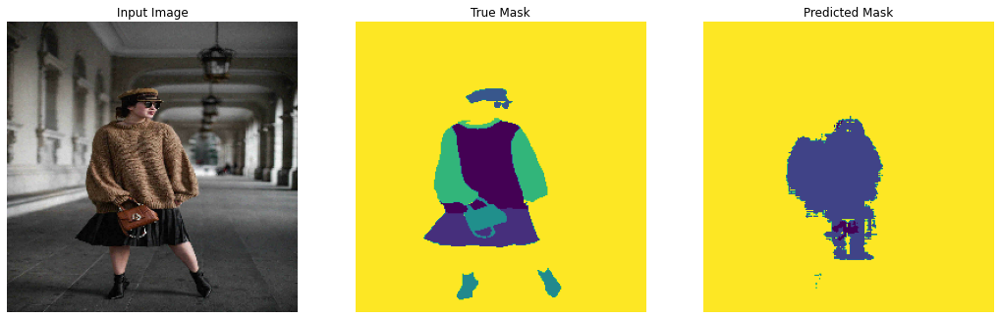

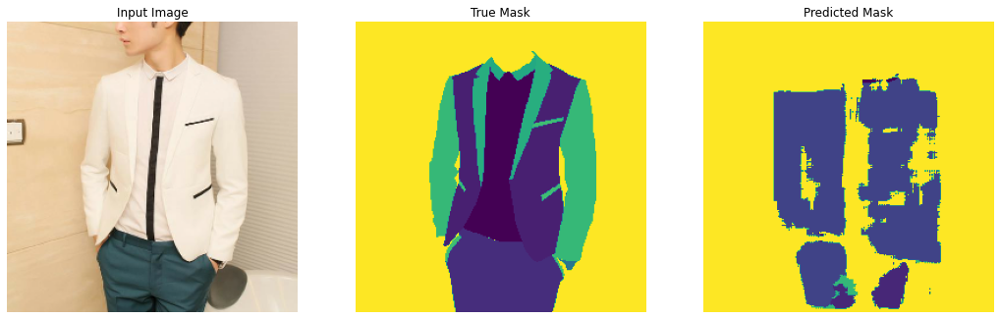

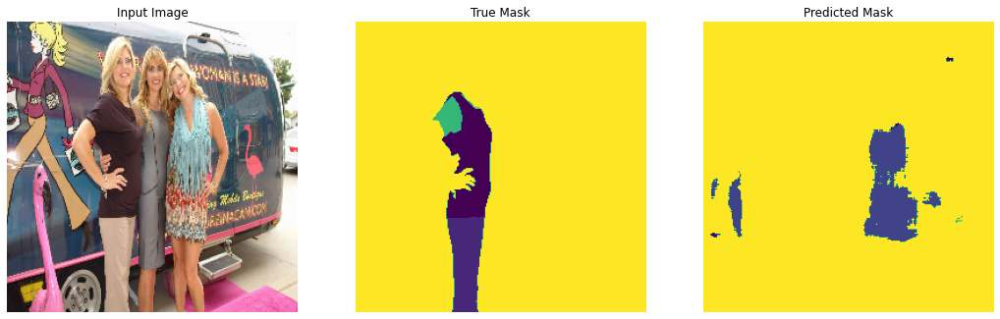

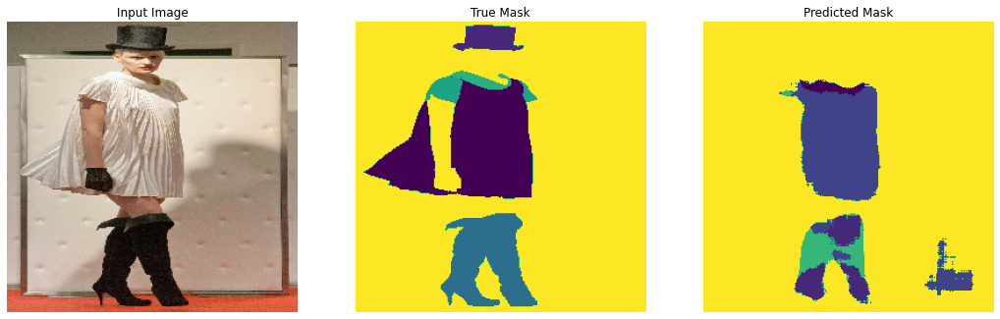

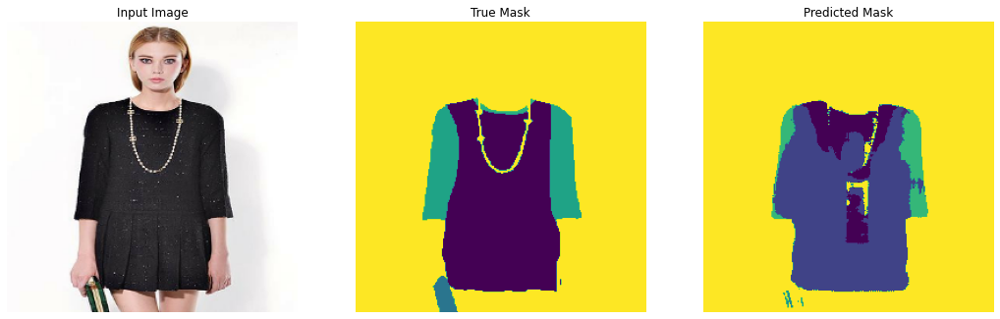

...

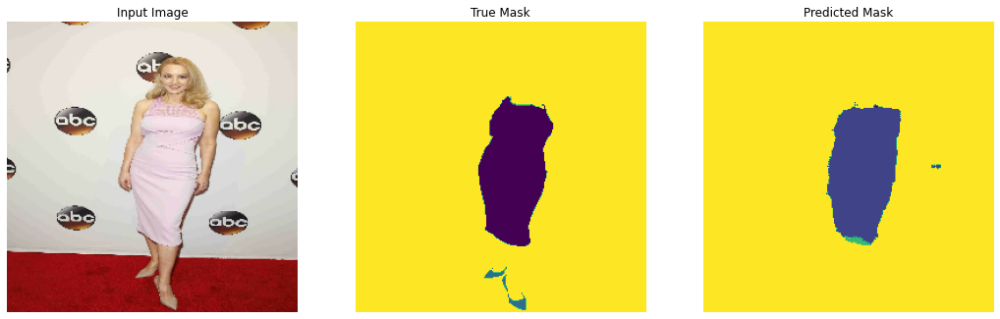

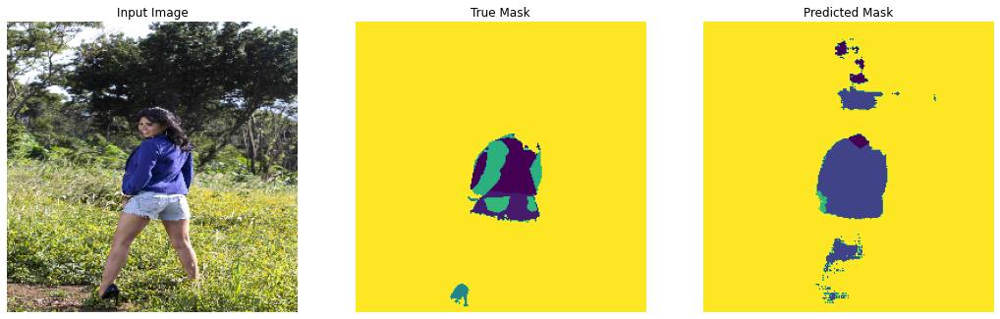

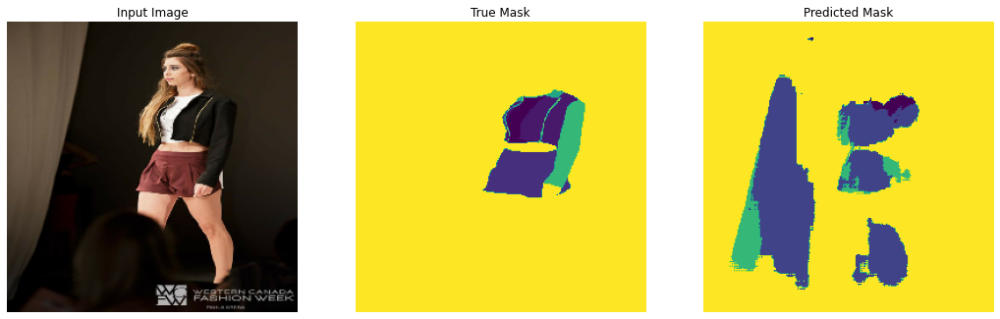

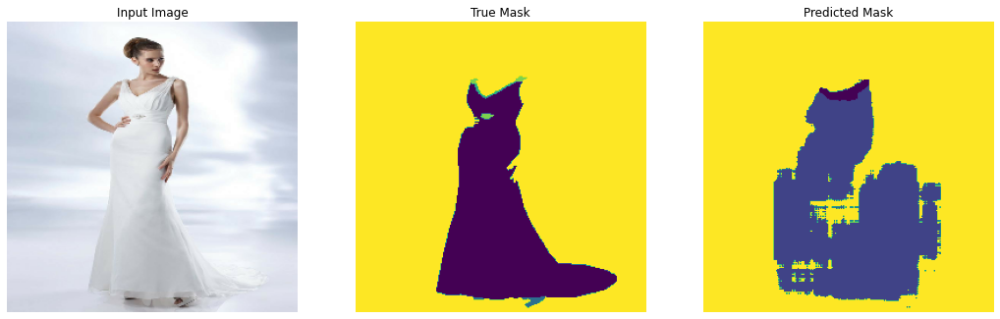

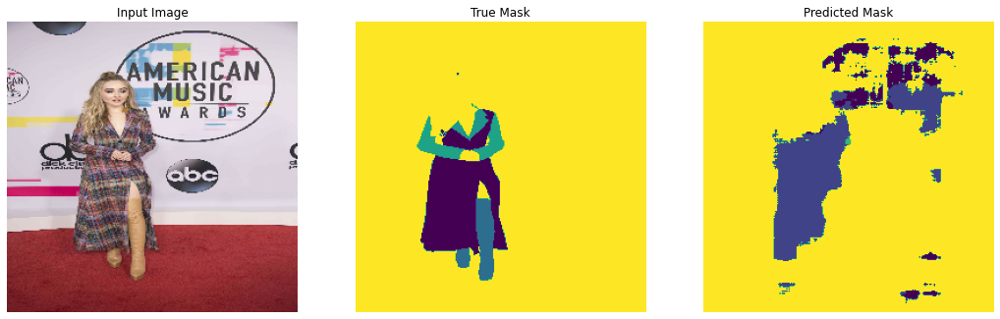

In [ ]:
show_predictions_unet_entropy_adam(sample)

### Entropy - SGD

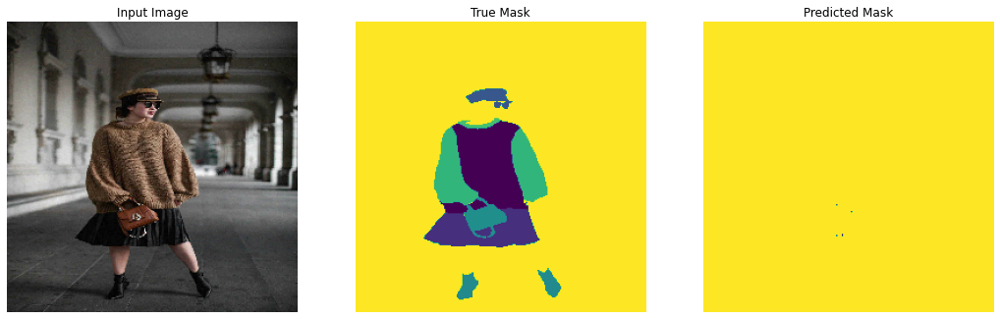

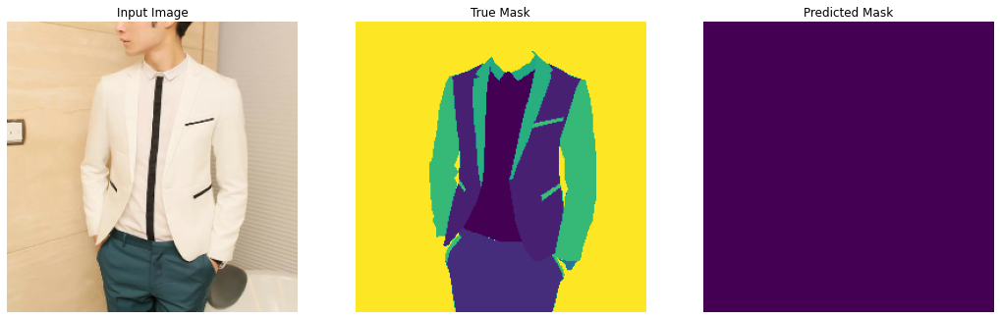

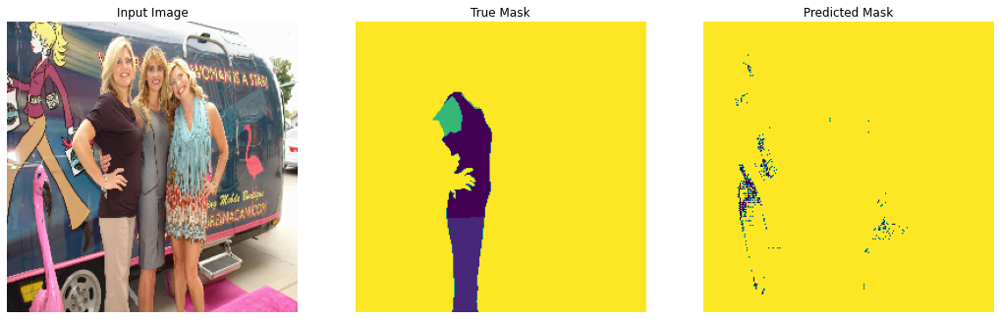

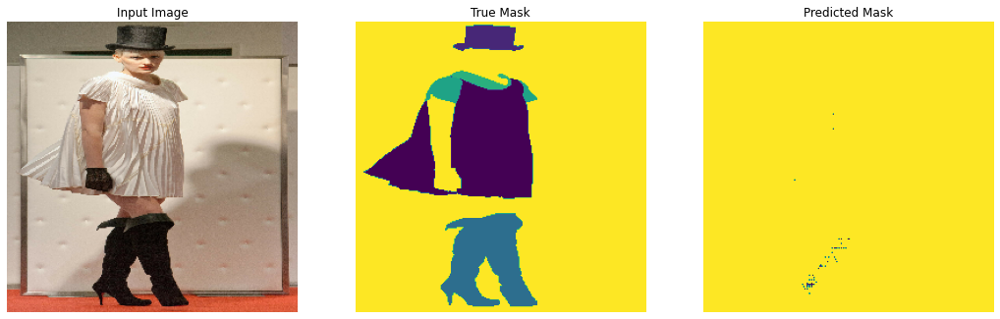

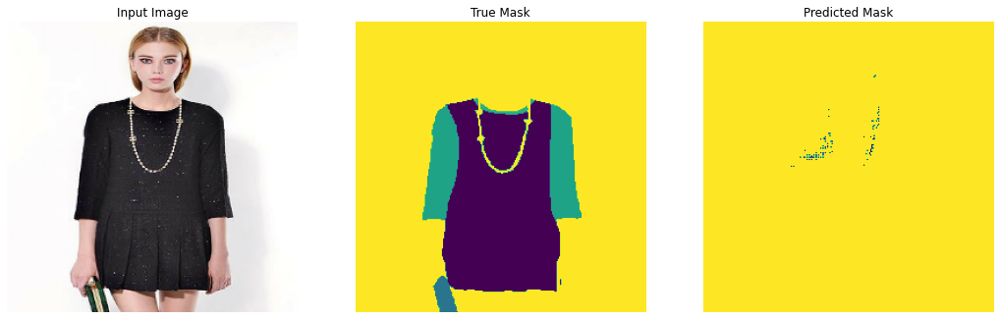

...

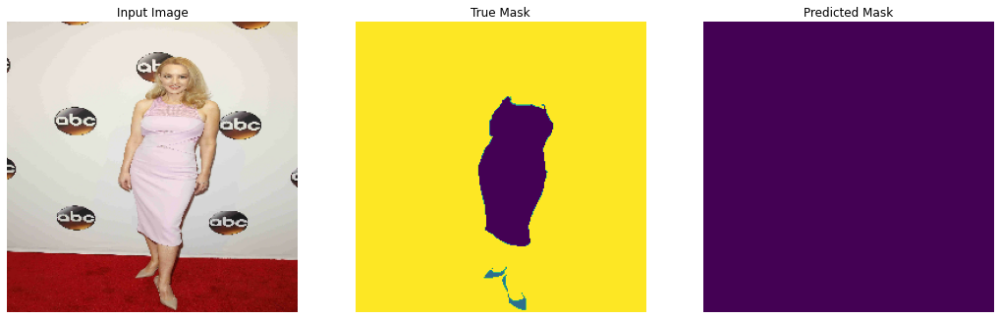

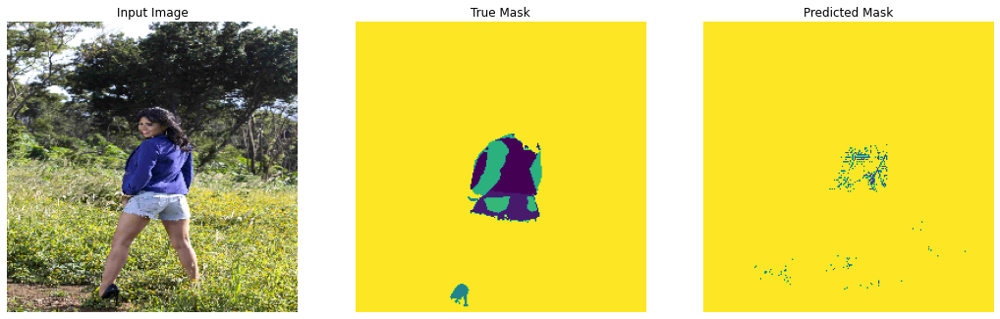

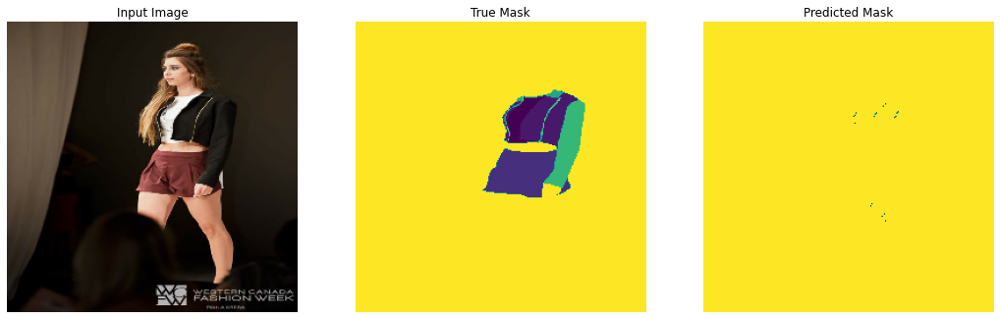

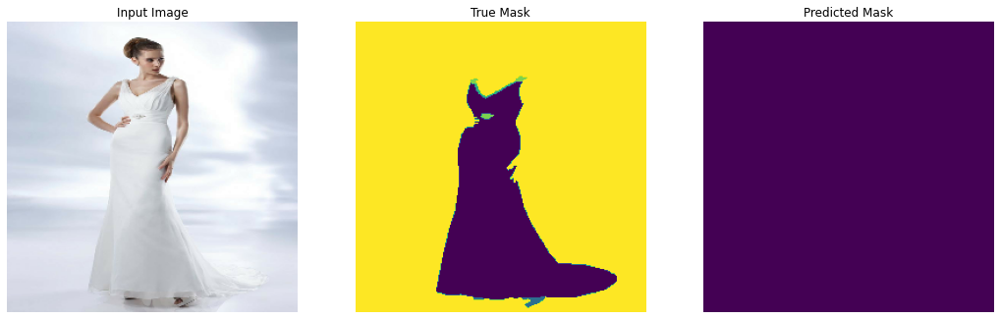

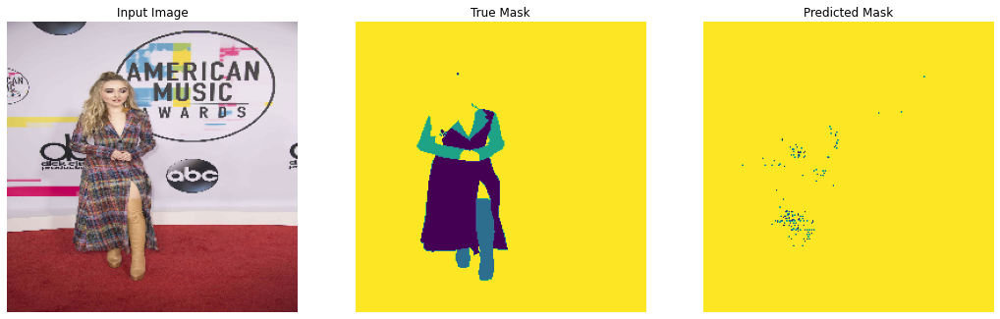

In [ ]:
show_predictions_unet_entropy_sgd(sample)

### Focal - Adam

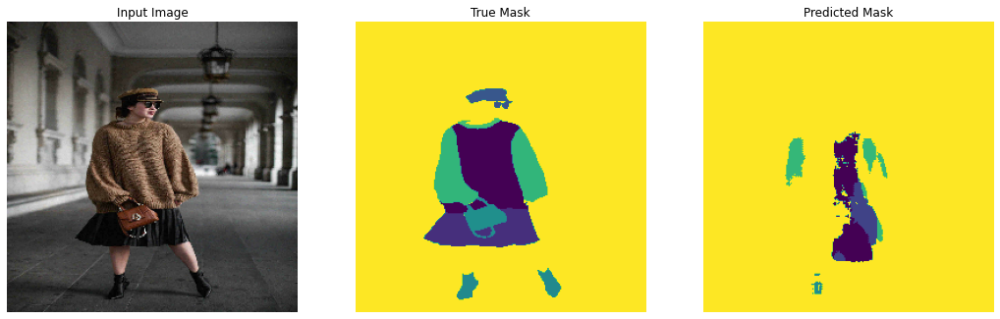

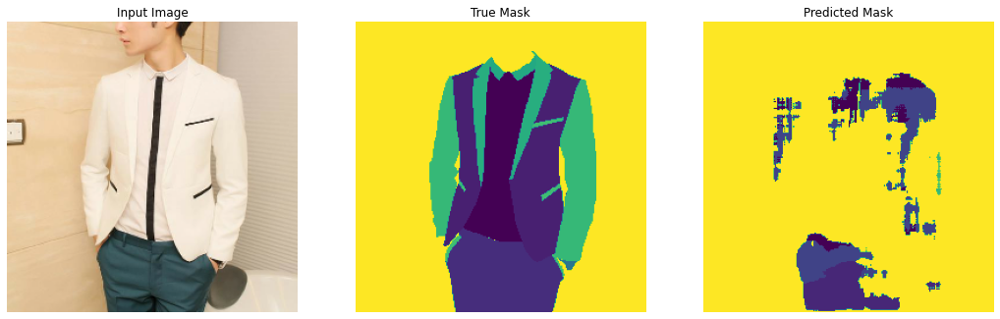

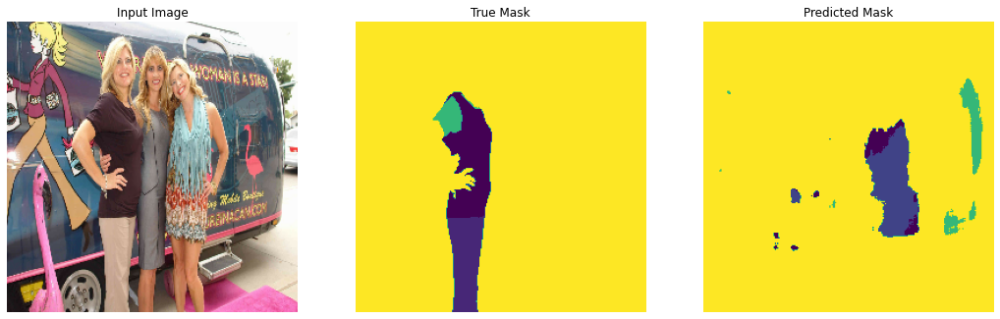

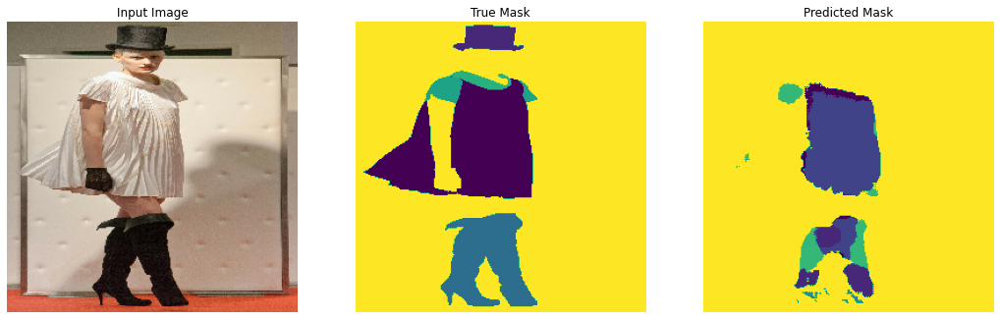

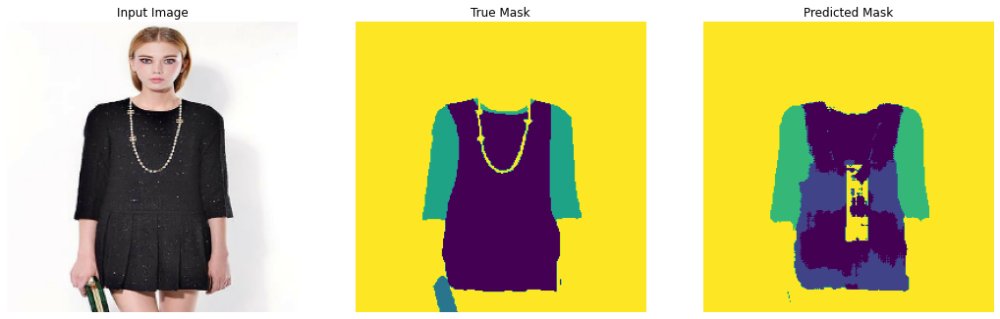

...

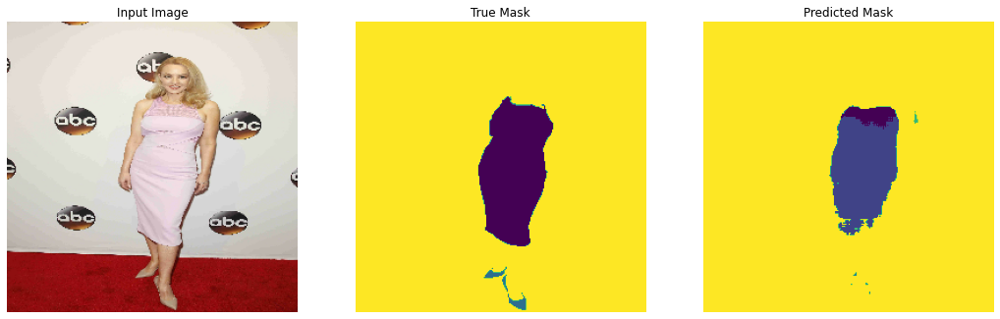

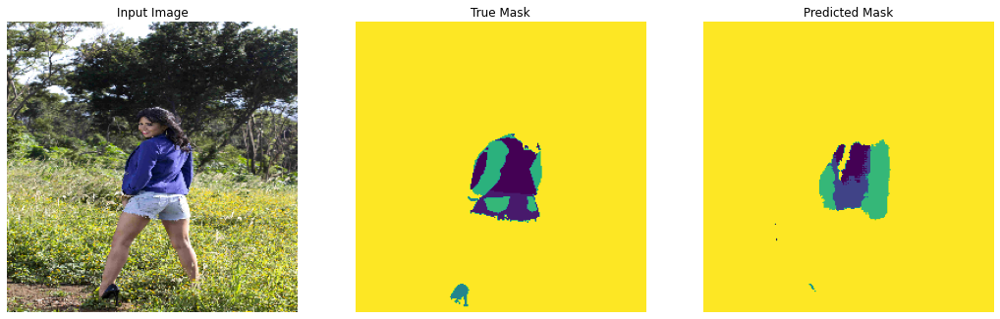

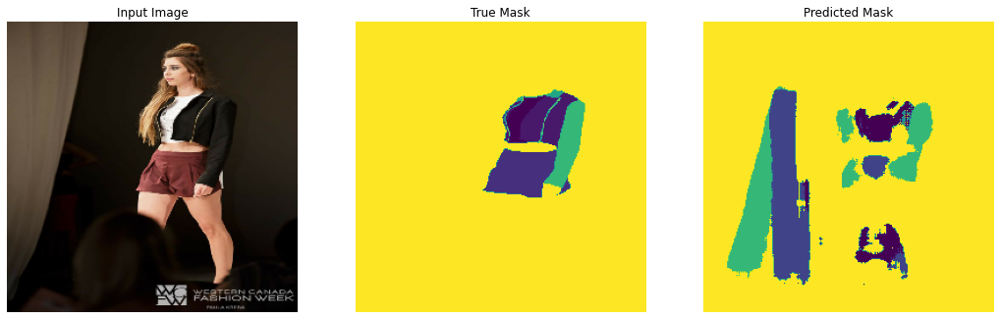

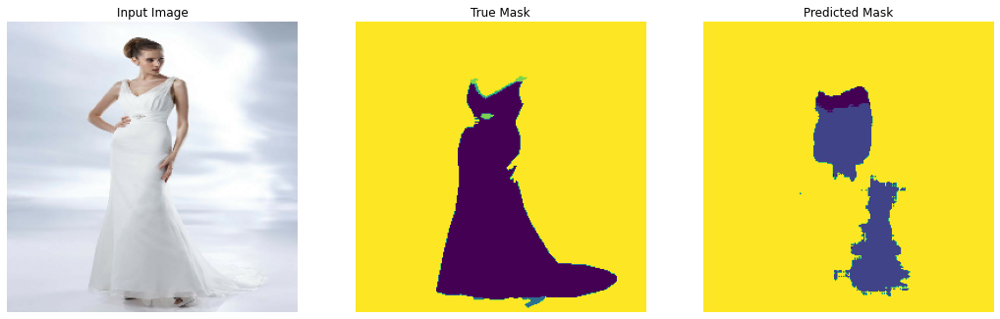

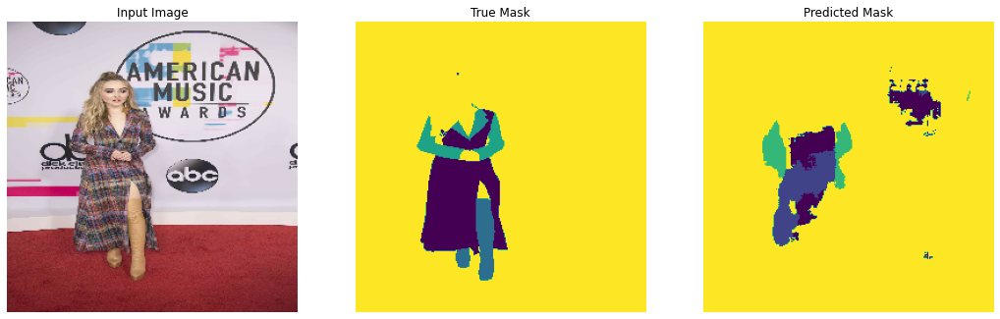

In [ ]:
show_predictions_unet_focal_adam(sample)

### Focal - SGD

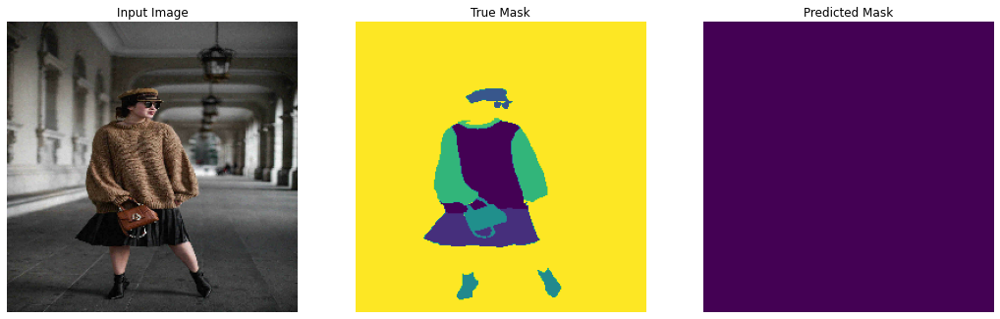

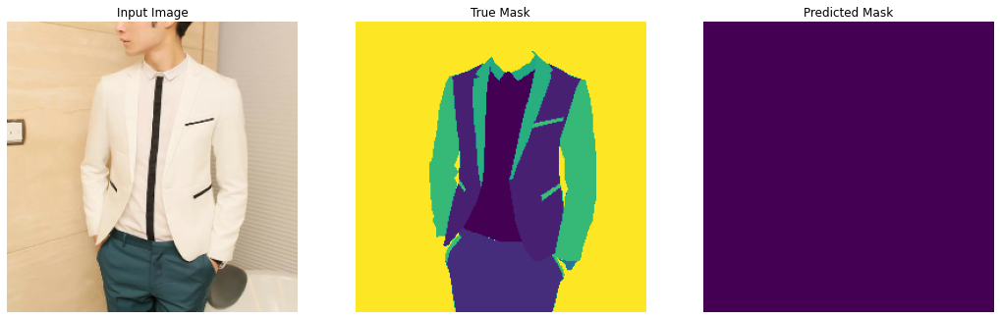

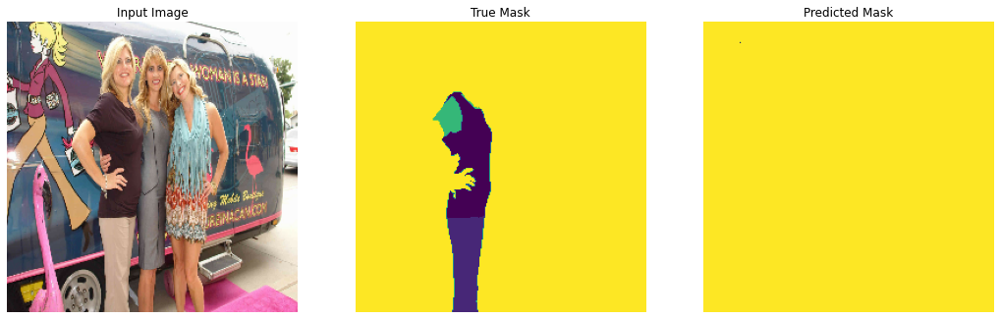

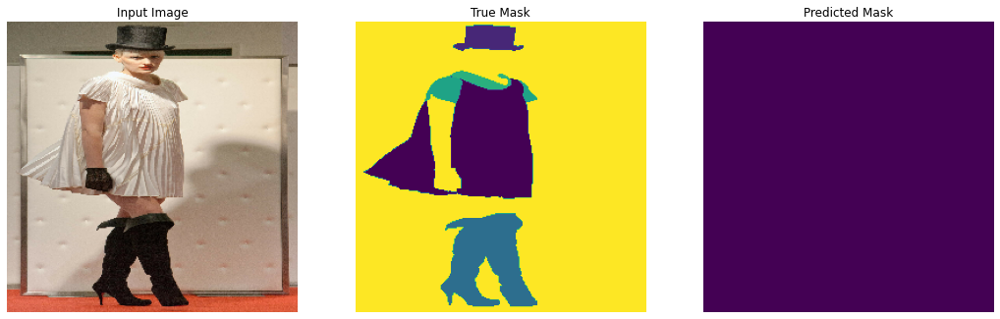

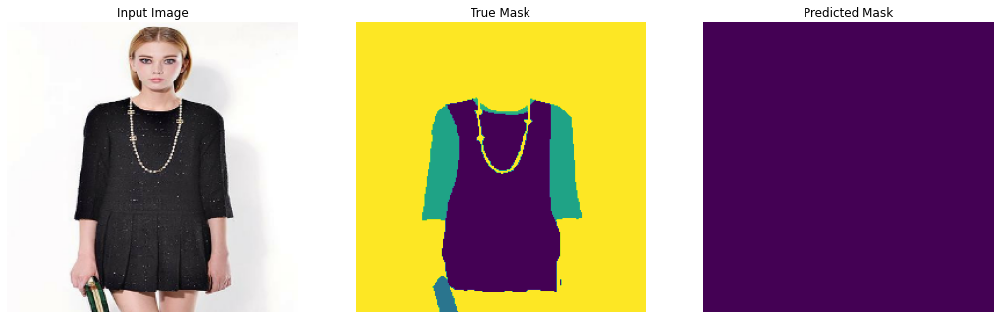

...

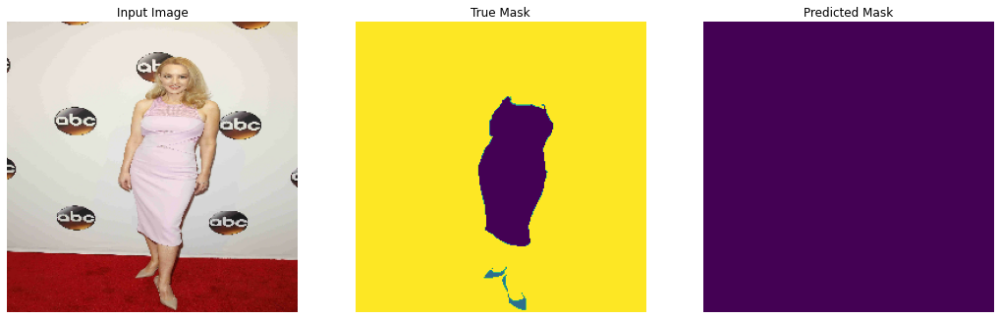

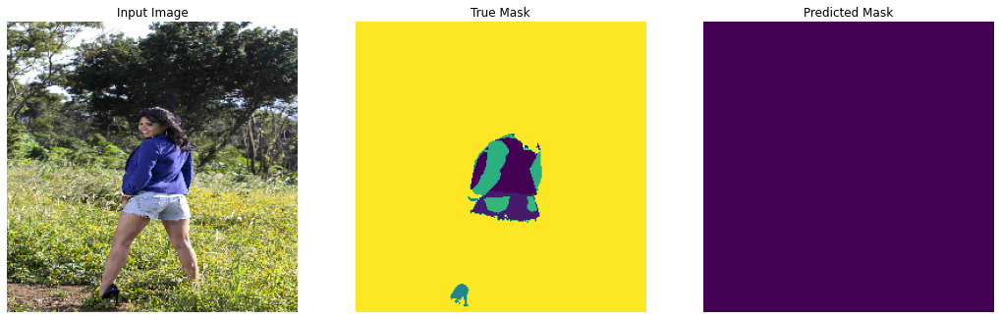

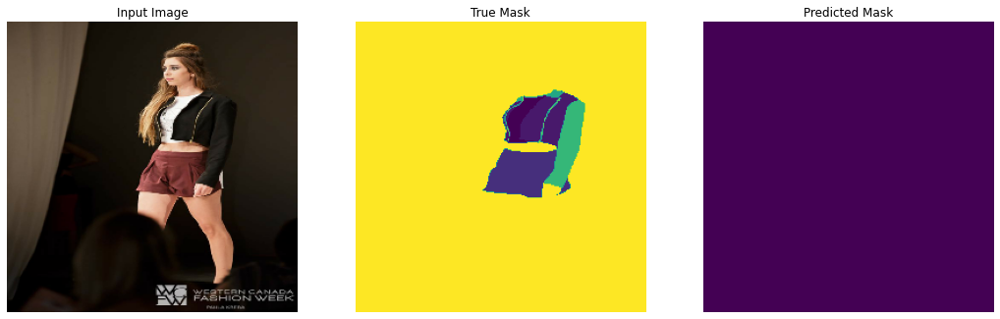

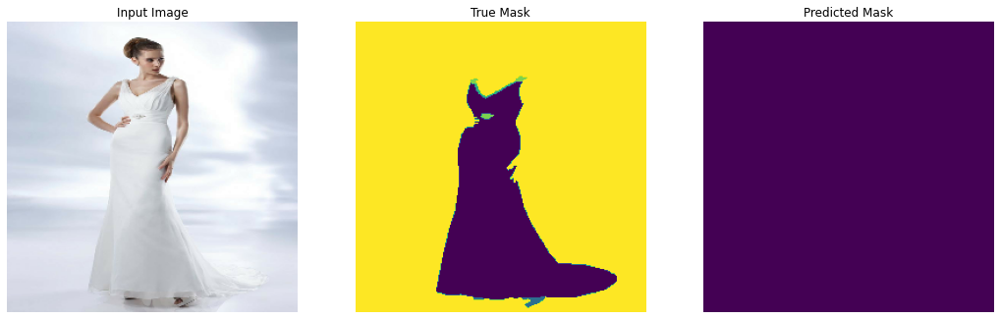

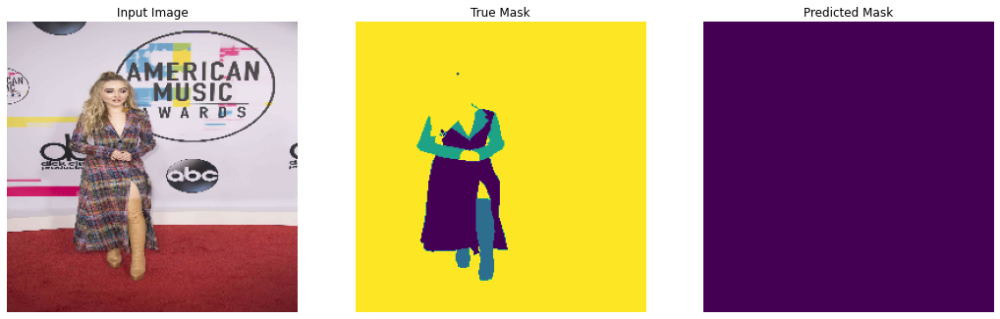

In [ ]:
show_predictions_unet_focal_sgd(sample)